# COGS 108 - EEG Headset Predictions

## Permissions

Place an `X` in the appropriate bracket below to specify if you would like your group's project to be made available to the public. (Note that student names will be included (but PIDs will be scraped from any groups who include their PIDs).

* [X] YES - make available
* [  ] NO - keep private

# Overview

We used a MUSE EEG headset to collect sensor data from a user during two experiments. In the first they alternated between mentally indicating ‘left,’ ‘right,’ or neither, and in the second they alternated between clenching the left and right side of their jaw. We aimed to use data science methods involving machine learning to create a model which could predict what the user was doing based on these voltage recordings. After initiating a convolutional neural network, our model was able to predict the correct direction of mental indication with 66% accuracy and the side of jaw clenching with 87% accuracy.

# Names

- Aidan Bell
- Phoebe Sonnad
- Kyle Burick
- Thea Zhang

<a id='research_question'></a>
# Research Question

Can data collected from a Muse EEG headset be used to predict whether the user is mentally indicating “right,” “left,” or neither?

<a id='background'></a>

## Background & Prior Work

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Since its discovery, electroencephalography has been widely used for capturing brain neural activity and identity health conditions in patients. With the emergence of machine learning, researchers have developing methods to be used to classify and analyze EEG readings. In “A Review on Machine Learning for EEG Signal Processing in Bioengineering,“ published in 2021,  Hosseini et al. discuss literature from 1988 to 2018 to compare and review previous applications of classification methods for EEGs. Based on their analysis of these methods, they find that “all the primary methods used in machine learning have been applied in some form in EEG classification,” and that “Supervised learning methods are on average of higher accuracy than their unsupervised counterparts.”

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;In 2017, Jaiswal et al. published a paper discussing using machine learning techniques for seizure detection. They state that the two basic steps in this process are “feature extraction and classification,” the latter of which was performed using Support Vector Machine (SVM) on a dataset of 500 EEG signals recorded under different scenarios. 
	
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;A study conducted in 2013 boasts that “machine learning methodology produces improved prediction performance compared to previous methods” in terms of quantitative biomarkers which discriminate responders from non-responders to SSRI treatment for major depressive disorder. 
	
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Clearly, there have been several decades of precedence for using Machine learning methods for bioengineering and healthcare applications, and our team was interested in the trajectory of technology related to neural networks and EEG devices. An article published this year in Marktechpost.com discusses the development of new Brain-Machine Interface (BMI) technology due to recent breakthroughs in deep learning and wearable wireless EEG devices, reporting that “Georgia Tech University’s Center for Human-Centric Interfaces and Engineering researchers [have] developed a BMI system that uses a neural network to analyze EEG data that can operate a robotic arm or wheelchair, allowing people to use the gadget to control a video game by merely visualizing the movement.” 
	
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Whereas access to EEG recording has previously been restricted to individuals and institutions who could afford the high overhead, these new wearable, wireless devices open the door to experimentation and use on the consumer level. 

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;The MUSE “brain-sensing” headband is an example of one of these products. It is a wearable headband containing 4 voltage sensors which noninvasively provide real-time biofeedback. The MUSE headband is marketed along with an app that aims to improve users’ meditation and sleep. We were interested in running an experiment combining MUSE sensor data and a neural network to develop a brain-machine interface. We want to collect and explore the data and determine if we can create a model to classify and predict whether the user is thinking “left” or “right” based on the voltages recorded from these four sensors. Hypothetically, this model could be used in a system where a user controls a remote just using mental intuition.


References (include links):
- 1) https://pubmed.ncbi.nlm.nih.gov/32011262/
- 2) https://pubmed.ncbi.nlm.nih.gov/29264792/
- 3) https://www.marktechpost.com/2021/10/06/researchers-develop-soft-scalp-electronics-sse-a-wireless-brain-machine-interface-bmi-system-using-convolutional-neural-networks-cnns/
- 4) https://www.sciencedirect.com/science/article/abs/pii/S1388245713003052

# Hypothesis


We hypothesize that we will be able to predict whether the user is mentally indicating “right”, “left”,
or neither with 90% accuracy using data recorded from a Muse electroencephalogram (EEG) headset with four EEG voltage sensors.

Using various data science tequniques, including machine learning, we think that there is enough data coming out of the headset to make an accurate prediction. The headset outputs around 100 observations/second, and it can already predict things such as wakefulness, attention, and blinking.


# Dataset(s)

We are using two custom datasets we created the data for in this project.
Below is code to load them in:

In [17]:
import os
import numpy as np
import pandas as pd
ACTIONS = ["left", "right", "none"]
def create_data(starting_dir="code/museData2021-control_random",random=False):
    training_data = {}
    for action in ACTIONS:
        if action not in training_data:
            training_data[action] = []

        data_dir = os.path.join(starting_dir,action)
        
        #load all data files in current directory into one file.
        for item in os.listdir(data_dir):
            #print(action, item)
            data = np.load(os.path.join(data_dir, item))
            for item in data:
                training_data[action].append(item.astype(float))
    #randomize data if desired
    if random:
        df_left = pd.DataFrame((2*np.random.randn(100000,4)), columns=['Voltage1', 'Voltage2','Voltage3','Voltage4'])
        df_left["Y"]=-1
        df_right = pd.DataFrame((2*np.random.randn(100000,4)), columns=['Voltage1', 'Voltage2','Voltage3','Voltage4'])
        df_right["Y"]=1
        df_none = pd.DataFrame((2*np.random.randn(100000,4)), columns=['Voltage1', 'Voltage2','Voltage3','Voltage4'])
        df_none["Y"]=0
    else:
        df_left = pd.DataFrame(training_data['left'], columns=['Voltage1', 'Voltage2','Voltage3','Voltage4'])
        df_left["Y"]=-1
        df_right = pd.DataFrame(training_data['right'], columns=['Voltage1', 'Voltage2','Voltage3','Voltage4'])
        df_right["Y"]=1
        df_none = pd.DataFrame(training_data['none'], columns=['Voltage1', 'Voltage2','Voltage3','Voltage4'])
        df_none["Y"]=0
    df_combined = pd.concat([df_left,df_none,df_right])
    return df_combined, df_left,df_none,df_right

In [18]:
ds_thinking_right_left, df_left,df_none,df_right = create_data(starting_dir="code/museData2021-onlythinking")
ds_jaws_right_left, df_left2,df_none2,df_right2 = create_data(starting_dir="code/museData2021-jaws2")

print(f"thinking left/none/right dataset has {len(ds_thinking_right_left)} datapoints, with "+
      f"{len(df_left)} left datapoints, {len(df_none)} left datapoints, and {len(df_right)} right datapoints")
print(f"jaws left/none/right dataset has {len(ds_jaws_right_left)} datapoints, with "+
      f"{len(df_left2)} left datapoints, {len(df_none2)} left datapoints, and {len(df_right2)} right datapoints")
print("thinking left/right/none dataset")
print(ds_thinking_right_left)
print("jaws clenched left/right/none dataset")
print(ds_jaws_right_left)

thinking left/none/right dataset has 72046 datapoints, with 24020 left datapoints, 24014 left datapoints, and 24012 right datapoints
jaws left/none/right dataset has 63037 datapoints, with 21010 left datapoints, 21014 left datapoints, and 21013 right datapoints
thinking left/right/none dataset
       Voltage1  Voltage2  Voltage3  Voltage4  Y
0      838.4982  849.3773  849.3773  845.7509 -1
1      842.9304  852.6007  852.1978  854.2125 -1
2      846.1539  850.1832  851.7949  859.4506 -1
3      835.6777  842.9304  850.5861  859.4506 -1
4      835.6777  844.1392  850.9890  851.7949 -1
...         ...       ...       ...       ... ..
24007  851.7949  847.7656  850.9890  839.7070  1
24008  848.9744  846.5568  851.7949  844.1392  1
24009  850.5861  845.3480  854.6154  865.4945  1
24010  855.0183  846.9597  851.3920  857.0330  1
24011  838.4982  846.5568  853.0037  842.1245  1

[72046 rows x 5 columns]
jaws clenched left/right/none dataset
       Voltage1  Voltage2  Voltage3  Voltage4  Y
0   

## Dataset description
The indexes in each dataset represent the relative time at which the recording was taken, and each measurment from the headset returns four different voltage readings in microvolts (uV). The Y column represents what value (-1 for left, 0 for none, 1 for right) that observation is associated with.

These datasets are being loaded in from files on this github, in the code/museData2021-onlythinking and code/museData2021-jaws2 folders. There aren't links to these datasets.

The first dataset (thinking right/left/none) was created by recording voltage readings when a user was thinking right/left/none (more information on this data aquisition process below)

The second dataset (jaws clenched right/left/none) was created by recording voltage readings when a user was clenching their jaws right/left/none 

# Setup

In [22]:
import numpy as np
import pandas as pd

# Import seaborn and apply its plotting styles
import seaborn as sns
sns.set(font_scale=2, style="white")

# import matplotlib
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.style as style
# set plotting size parameter
plt.rcParams['figure.figsize'] = (12, 5)

import numpy
import matplotlib.pyplot as plt
from pandas import read_csv
import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import sys
from sklearn import preprocessing
from sklearn import utils

from keras.models import load_model
from tensorflow import keras
from IPython.display import display
import ipywidgets as widgets

from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, Conv1D, MaxPooling1D, BatchNormalization
from keras import regularizers
from keras.layers import Lambda
import keras.backend as K

import os
import re
import time

from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sn
from confusion_matrix_pretty_print import pretty_plot_confusion_matrix

# Data Cleaning

Below is the code we use to read in new data live from the headset, with the help of an external C# program writing data to file 'filename'.<br><br>
This code prompts the user to think/do right, left, and none for set amounts of time, and records the data. <br><br>
Our code converts the input stream from a text file into arrays, and then saves those arrays. Most of the code below is dealing with file processing and text stuff, the only real data processing we do is delete the last few seconds of data if there is ever a "lost connection" signal (meaning one of the electrodes does not have good skin contact)
<br><br>
You can ignore this and just imagine the dataset magically appears below for future steps to simplify things!

In [ ]:
#file to read data from:
filename = '../../oscStream.txt'
datadir = "code/museData2021-onlythinking"#
cached_time =""
proc_data=[]
prev_index=0;
counter=0
ACTIONS = ["left", "right", "none"]
def wipefile():
    try:
        f=open(filename,"w")
        f.write("")
        f.close()
    except PermissionError:
        time.sleep(.005)
        wipefile()

wipefile()
out1 = widgets.HTML()
display(out1)
out2 = widgets.HTML()
display(out2)
out3 = widgets.HTML()
display(out3)

#how long to record for
duration_of_rec=3000
for rep in range(0,4):
    for action in ACTIONS:
        out2.value=f"<h1>think/do {action}</h1>"
        time.sleep(2)
        
        proc_data=[]
        f= open(filename,"r")
        raw=f.readlines()
        prev_index=len(raw)
        while len(proc_data)<duration_of_rec:
            out1.value="<h1>recording</h1>"
            stamp = os.stat(filename).st_mtime
            if stamp != cached_time or cached_time=="":
                cached_time = stamp

                counter=counter+1
                if counter > 30:
                    out3.value=f"<h1>progress {len(proc_data)}/{duration_of_rec}</h1>"
                    counter=0

                f= open(filename,"r")
                raw=f.readlines()
                contents =raw[prev_index:]
                prev_index=len(raw);

                for x in contents:
                    if(x.find("jaw") != -1):
                        jj=1
                    elif(x.find("blink") != -1):
                        jj=1
                    elif(x.find("horseshoe") != -1):
                        out1.value="<h1 style=\"color:red;\">lost signal</h1>"
                        if len(proc_data) > 200:
                            #delete some data if there was a lost signal
                            proc_data=proc_data[:-30]
                        else:
                            proc_data=[]
                        break;
                    elif(x.find("eeg") != -1):
                        temp = x.split('[')
                        tempA=[]
                        for w in range(1,5):
                            y=temp[w]
                            tempA.append(re.findall("[\d.]+",y)[0])
                        proc_data.append(tempA)
        data=proc_data
        #make directories if they don't exist
        if not os.path.exists(datadir):
            os.mkdir(datadir)
        actiondir = f"{datadir}/{action}"
        if not os.path.exists(actiondir):
            os.mkdir(actiondir)
        np.save(os.path.join(actiondir, f"{int(time.time())}.npy"), data)

print("all done!")
wipefile()

HTML(value='')

HTML(value='')

HTML(value='')

### This is a video showing the recording process, as you won't be able to run this code without a muse EEG headset

In [35]:
from IPython.display import Video

Video("recording_data_vid.mp4", embed=True)

https://www.youtube.com/watch?v=urnwQcQK9z4

## Clean + process data so that it can be used as training data for machine learning

Most of the tricky data wrangling is in this step, because we need to sample chunks of the data to prepare them to be used as training data for the ML network.

this code takes in a dataframe like this:

In [ ]:
print(ds_thinking_right_left)

and we want to output an array of chunks of observations of length 'look_back', that is linked to another array that has one hot encoded expected results (right, left, or none) from each chunk

In [ ]:
from IPython.display import HTML

HTML('''<script>
    code_show=true; 
    function code_toggle() {
     if (code_show){
     $('div.input').hide();
     } else {
     $('div.input').show();
     }
     code_show = !code_show
    } 
    $( document ).ready(code_toggle);
    </script>
    <form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

#training a control on completely random data
random_model, trainX, trainYr, testXr, testYr, scaler = train_network(batch_size=50, starting_dir="code/museData2021-control_random",
                             random=True, look_back = 200,model_save_dir="onlythinking",epochs=2)


In [24]:
#variable that controls how far back in time the model looks from the current timestamp
def create_trainable_data(starting_dir="code/museData2021-control_random",random=False, look_back = 100,ravel=True):
    df_combined, df_left,df_none,df_right=create_data(starting_dir=starting_dir,random=random)
    #true for data input to conv layer, false if input to LSTM layer

    def one_hot_encode(num):
        if num == -1:
            return [1,0,0]
        if num == 0:
            return [0,1,0]
        if num == 1:
            return [0,0,1]

    # convert an array of values into a dataset matrix
    def create_dataset(dataset, look_back=1):
        numcols = len(dataset[0])
        num_output_cols = (numcols-1)*look_back + 1
        dataX, dataY = [], []
        for i in range(0,len(dataset) - look_back + 1,int(look_back/1)):
            if True:
                a = dataset[i:(i + look_back), :-1]
                dataX.append(a)
                dataY.append(one_hot_encode(dataset[i + look_back-1, numcols-1]))
        return numpy.array(dataX), numpy.array(dataY)

    # load the dataset
    dataset = df_combined.values
    dataset = dataset.astype('float32')

    # normalize the dataset
    scaler = preprocessing.StandardScaler().fit(dataset[:,:-1])
    dataset[:,:-1] = scaler.transform(dataset[:,:-1])
    numpy.set_printoptions(threshold=300.0)


    # split into train and test sets
    X, Y = create_dataset(dataset, look_back)

    train_test_ratio = 0.8
    train_size = int(len(X) * train_test_ratio)
    test_size = len(X) - train_size

    #shuffle data and split into training and test data
    Xshuf, Yshuf = utils.shuffle(X, Y)
    trainX, testX = Xshuf[0:train_size], Xshuf[train_size:len(Xshuf)]
    trainY, testY = Yshuf[0:train_size], Yshuf[train_size:len(Yshuf)]

    #transform data if data is going into convolutional layer, otherwise leave as is for input to LSTM layer
    if ravel:
        nx1=[]
        nx2=[]
        for e in range(0,len(trainX)):
            volt=[]
            for v in range(4):
                variance=[]
                for i in range(0,len(trainX[0])):
                    volt.append(np.array(trainX[e][i][v]))
                    variance.append(np.array(trainX[e][i][v]))
                 #add variance variable to data, it can be difficult for a deep learning network to figure this out on its own
                volt.append(np.var(np.array(variance)))
            nx1.append(volt)
        for e in range(0,len(testX)):
            volt=[]
            for v in range(4):
                variance=[]
                for i in range(0,len(testX[0])):
                    volt.append(np.array(testX[e][i][v]))
                    variance.append(np.array(trainX[e][i][v]))
                volt.append(np.var(np.array(variance)))
            nx2.append(volt)

        trainX=np.array(nx1)
        testX=np.array(nx2)
    return trainX, trainY, testX, testY, scaler


# Data Analysis & Results

In [4]:
#Creating datafram containing all data collected as 'Voltage 1', with each trial
data_V1 = [df_none['Voltage1'], df_left['Voltage1'], df_right['Voltage1']]
headers = ['None', 'Left', 'Right']
df_V1 = pd.concat(data_V1, axis=1, keys=headers)

#Creating datafram containing all data collected as 'Voltage 2', with each trial
data_V2 = [df_none['Voltage2'], df_left['Voltage2'], df_right['Voltage2']]
df_V2 = pd.concat(data_V2, axis=1, keys=headers)

#Creating datafram containing all data collected as 'Voltage 3', with each trial
data_V3 = [df_none['Voltage3'], df_left['Voltage3'], df_right['Voltage3']]
df_V3 = pd.concat(data_V3, axis=1, keys=headers)

#Creating datafram containing all data collected as 'Voltage 4', with each trial
data_V4 = [df_none['Voltage4'], df_left['Voltage4'], df_right['Voltage4']]
df_V4 = pd.concat(data_V4, axis=1, keys=headers)

In [5]:
def deviation_from_none(df):
    """
    Returns a list in the format [Left, Right].
    Left is the average difference between the average of the none column and the none column
    Right is the average difference between the average of the none column and the none column
    """
    none_mean = df['None'].mean()

    Left = (df['Left'] - none_mean).mean()
    Right = (df['Right'] - none_mean).mean()

    return [Left, Right]

In [6]:
# Create a new dataset for plotting and calculating difference in the deviations.
deviation_V1 = deviation_from_none(df_V1)
deviation_V2 = deviation_from_none(df_V2)
deviation_V3 = deviation_from_none(df_V3)
deviation_V4 = deviation_from_none(df_V4)

deviations = pd.DataFrame({'V1': deviation_V1, 'V2': deviation_V2, 'V3': deviation_V3, 'V4': deviation_V4})
deviations = deviations.transpose()
deviations.rename(columns = {0: 'Left', 1:'Right'}, inplace = True)
deviations['Difference (uV)'] = np.abs(deviations['Left'] - deviations['Right'])
deviations['Sensor'] = deviations.index
deviations.reset_index(drop = True, inplace = True)
deviations

,Left,Right,Difference (uV),Sensor
0,-0.006286,0.427249,0.433535,V1
1,0.130272,0.461926,0.331654,V2
2,-0.025363,-0.215401,0.190038,V3
3,-0.384679,-0.196452,0.188227,V4


[Text(0.5, 1.0, 'Voltage Difference Right vs Left')]

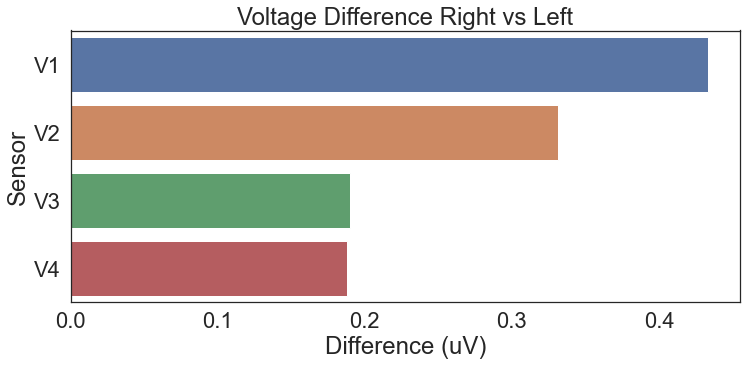

In [7]:
# Plot how each voltage sensor's data differs between thinking left and right
# How far apart are the differences between neutral and left, and neutral and rigt
sns.barplot(y = 'Sensor', x = 'Difference (uV)', data = deviations).set(title = 'Voltage Difference Right vs Left')

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;We wanted to get an initial look at what voltage sensors seemed to be the most predictive, so
we graphed where the right and left deviated the most from the neutral position. To see
where it deviated, we subtracted the amount the left position voltage deviates from the neutral
position from the amount that the right position voltage deviates from the neutral position. It seemed like voltage sensors 1 and 2 had the most difference in the way that they deviated from the neutral position.

In [8]:
# Reformatting the data to better work with bar charts.
v1 = df_combined.loc[:,['Voltage1', 'Y']]
v1['Sensor'] = 'Voltage1'
v1 = v1.rename(columns = {'Voltage1': 'Voltage'})

v2 = df_combined.loc[:,['Voltage2', 'Y']]
v2['Sensor'] = 'Voltage2'
v2 = v2.rename(columns = {'Voltage2': 'Voltage'})

v3 = df_combined.loc[:,['Voltage3', 'Y']]
v3['Sensor'] = 'Voltage3'
v3 = v3.rename(columns = {'Voltage3': 'Voltage'})

v4 = df_combined.loc[:,['Voltage4', 'Y']]
v4['Sensor'] = 'Voltage4'
v4 = v4.rename(columns = {'Voltage4': 'Voltage'})

df2_combined = v1.append([v2, v3, v4])
df2_combined['Y'] = df2_combined['Y'].map({-1: 'left', 0: 'neutral', 1: 'right'})
df2_combined

,Voltage,Y,Sensor
0,836.4835,left,Voltage1
1,839.3040,left,Voltage1
2,842.1245,left,Voltage1
3,839.3040,left,Voltage1
4,836.8865,left,Voltage1
...,...,...,...
12002,855.0183,right,Voltage4
12003,850.1832,right,Voltage4
12004,857.4359,right,Voltage4
12005,857.4359,right,Voltage4


Text(0, 0.5, 'Voltage (uV)')

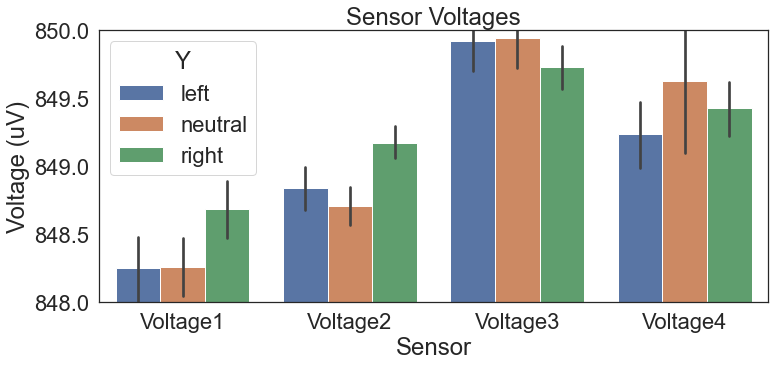

In [9]:
plot = sns.barplot(x = 'Sensor', y = 'Voltage', hue = 'Y', data = df2_combined)
plot.set_ylim(bottom = 848, top = 850)
plot.set(title='Sensor Voltages')
plot.set_ylabel("Voltage (uV)")

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;With this graph we wanted to get a general idea of any trends that could show up when looking
right and left. On every sensor, the right and left consistently move in the same direction from the
neutral position, however in the voltage sensor 1, the voltage reading tends to decrease slightly when
thinking left and the voltage reading tends to increase when thinking right.

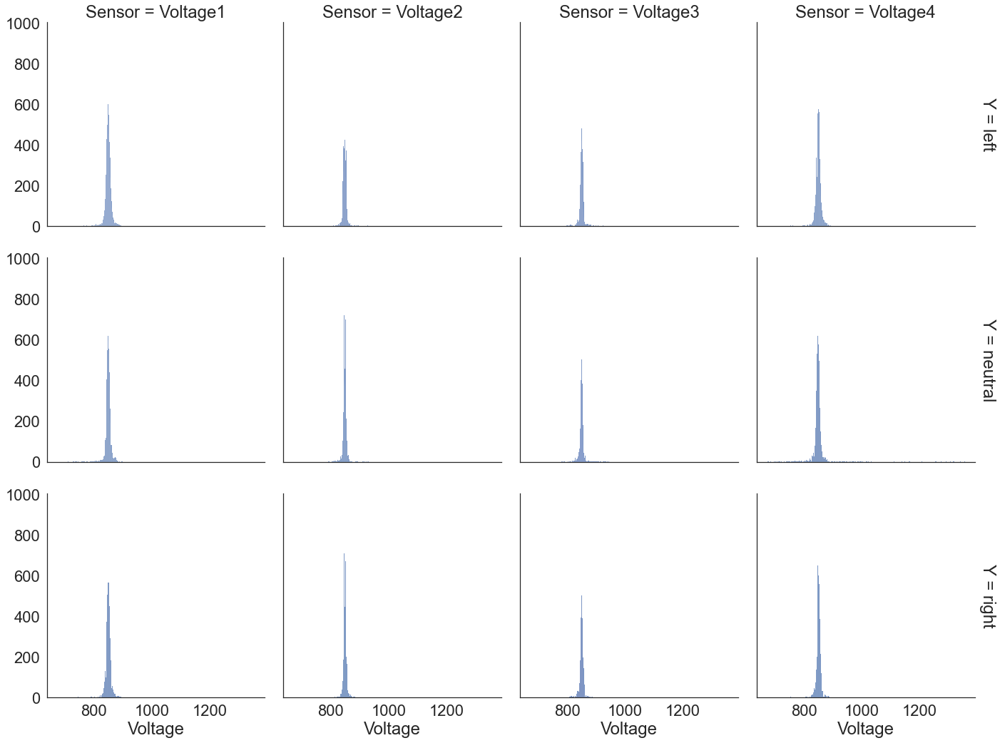

In [12]:
plot = sns.FacetGrid(df2_combined, col = 'Sensor', row = 'Y', height = 5, aspect = 1, margin_titles = True)
plot.map(sns.histplot, 'Voltage')

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;With this histogram matrix, we wanted to get a better idea about how clenching left and right
influenced the voltage reading spikes and the variation in voltage readings. The three rows are clench
the left, neutral, and right side of the jaw and the four columns each represent one of the EEG
voltage sensors. It was especially clear that in voltage senor 1, the variance increases when clenching left and decreases when clenching right, and on sensor 2, the variance decreases when clenching right, but there are lower voltage spikes when clenching left.

# Set up neural network architecture + training procedure

In [334]:
#check GPU works for faster training
from tensorflow.python.client import device_lib
import tensorflow as tf
sess = tf.compat.v1.Session(config=tf.compat.v1.ConfigProto(log_device_placement=True))

Device mapping:
/job:localhost/replica:0/task:0/device:GPU:0 -> device: 0, name: NVIDIA GeForce GTX 1070, pci bus id: 0000:01:00.0, compute capability: 6.1



In [25]:
def train_network(starting_dir="code/museData2021-control_random",random=False, look_back = 100,
                  model_save_dir="onlythinking",batch_size=10,epochs=1,ravel=True):
    trainX, trainY, testX, testY, scaler = create_trainable_data(starting_dir=starting_dir,random=random, look_back = look_back)
    
    if not os.path.exists(model_save_dir):
                os.mkdir(model_save_dir)

    # create the network, using convolutional layers
    model = Sequential()
    model.add(Conv1D(32, kernel_size=10,
                     activation='relu',
                     input_shape=[(look_back+1)*4,1],
                     padding='same',
                     strides=4,
                     kernel_initializer='glorot_uniform',
                     kernel_regularizer=regularizers.l2(l=0.0001)))
    model.add(BatchNormalization())
    model.add(MaxPooling1D(pool_size=4, strides=None, padding='same'))
    
    #added dropout layer to prevent overfitting, this was happening a lot
    model.add(Dropout(0.3))

    model.add(Conv1D(16, kernel_size=3,
                     activation='relu',
                     input_shape=[look_back,1],
                     padding='same',
                     strides=1,
                     kernel_initializer='glorot_uniform',
                     kernel_regularizer=regularizers.l2(l=0.0001)))
    model.add(BatchNormalization())
    model.add(MaxPooling1D(pool_size=4, strides=None, padding='same'))

    model.add(Lambda(lambda x: K.mean(x, axis=1))) 

    model.add(Dense(3))
    model.add(Activation('softmax'))

    model.compile(loss='categorical_crossentropy',
                  optimizer='adam',
                  metrics=['accuracy'])


    #train network!
    for epoch in range(epochs):
        model.fit(trainX, trainY, epochs=25, batch_size=batch_size, verbose=1,validation_data=(testX,testY)) 
        score = model.evaluate(testX, testY, batch_size=batch_size)
        print(score)
        MODEL_NAME = f"{model_save_dir}\\{round(score[1]*100,2)}-acc-64x3-batch-norm-{epoch}epoch-{int(time.time())}-loss-{round(score[0],2)}.h5"
        model.save(MODEL_NAME)
    print("saved:")
    print(MODEL_NAME)


    # make predictions
    trainPredict = model.predict(trainX)
    testPredict = model.predict(testX)

    trainScore = math.sqrt(mean_squared_error(trainY, trainPredict[:]))
    print('Train Score: %.2f RMSE' % (trainScore))
    testScore = math.sqrt(mean_squared_error(testY, testPredict[:]))
    print('Test Score: %.2f RMSE' % (testScore))

    binarized_testY = numpy.array([np.argmax(v) for v in testPredict])
    binarized_trainY = numpy.array([np.argmax(v) for v in trainPredict])

    train_acc=0.0
    for v in range (0,len(trainY)):
        if np.argmax(trainY[v]) == binarized_trainY[v]:
            train_acc = train_acc + 1/len(trainY)
    print("train accuracy: ")
    print(train_acc)
    test_acc=0.0
    for v in range (0,len(testY)):
        if np.argmax(testY[v]) == binarized_testY[v]:
            test_acc = test_acc + 1/len(testY)
    print("test accuracy: ")
    print(test_acc)

    score = model.evaluate(testX, testY, batch_size=1000)
    print(score)

    return model, trainX, trainY, testX, testY, scaler

# Testing our network on 3 different datasets

##### 1: a model trained on random input data as a control
##### 2: a model predicting right/left thinking
##### 3: a model predicting right/left jaw clenching with high accuracy to show that our setup actually works, despite low-ish accuracy of predicting right/left thinking

# Random dataset training for control comparison

In [122]:
#training a control on completely random data
random_model, trainXr, trainYr, testXr, testYr, scaler = train_network(batch_size=50, starting_dir="code/museData2021-control_random",
                             random=True, look_back = 200,model_save_dir="onlythinking",epochs=2)

Epoch 1/25
24/24 [==============================] - 1s 27ms/step - loss: 2.1271 - accuracy: 0.3325 - val_loss: 1.1249 - val_accuracy: 0.3267
Epoch 2/25
24/24 [==============================] - 0s 15ms/step - loss: 1.4593 - accuracy: 0.3342 - val_loss: 1.1126 - val_accuracy: 0.2867
Epoch 3/25
24/24 [==============================] - 0s 14ms/step - loss: 1.2184 - accuracy: 0.3325 - val_loss: 1.1508 - val_accuracy: 0.3100
... edited so this segment isn't really long in github...Epoch 24/25
24/24 [==============================] - 0s 14ms/step - loss: 1.0068 - accuracy: 0.4950 - val_loss: 1.1455 - val_accuracy: 0.3333
Epoch 25/25
6/6 [==============================] - 0s 5ms/step - loss: 1.1439 - accuracy: 0.3200
[1.1439467668533325, 0.3199999928474426]
saved:
onlythinking\32.0-acc-64x3-batch-norm-1epoch-1639176507-loss-1.14.h5
Train Score: 0.44 RMSE
Test Score: 0.48 RMSE
train accuracy: 
0.5850000000000067
test accuracy: 
0.3200000000000001
1/1 [==============================] - 0s 196ms/

# Random data confusion matrix & success statistics

predicted:
[2 1 1 2 0 1 2 2 1 0 0 2 0 2 2 1 1 0 0 2 1 2 2 1 0 0 0 0 0 0 2 1 1 1 1 1 2
 0 0 2 2 1 2 0 0 2 1 0 2 0 0 2 2 2 1 0 0 1 2 1 2 2 0 2 0 2 0 0 0 1 0 1 0 0
 0 2 0 0 1 0 1 2 1 0 0 0 1 2 0 1 2 1 2 0 1 2 0 0 0 0 1 0 0 2 0 1 2 2 2 1 1
 1 2 0 0 2 0 1 0 0 1 2 2 2 2 2 2 2 0 2 2 0 2 2 2 1 1 1 0 0 0 2 2 1 2 2 2 1
 2 2 0 0 1 0 2 0 2 1 0 0 1 0 1 2 1 0 0 1 2 0 2 1 1 0 2 2 1 0 0 0 2 2 2 2 2
 2 0 2 2 2 0 1 1 0 0 1 2 2 2 1 0 0 0 0 2 2 0 1 2 0 0 2 0 0 0 1 0 2 2 0 1 0
 2 0 0 0 1 0 2 2 2 0 0 0 2 1 2 0 0 0 2 1 2 2 1 0 2 1 2 0 2 1 2 0 0 2 2 1 1
 2 0 0 2 0 2 2 0 0 1 0 0 1 0 1 1 2 1 1 2 1 2 1 0 0 0 0 2 1 2 0 2 0 2 1 0 1
 0 1 0 0]
(300,)
actual:
[2 0 1 0 1 1 2 1 0 0 0 2 0 2 1 0 1 1 2 0 1 2 0 0 2 1 2 1 2 1 0 0 2 2 1 0 0
 1 1 2 0 1 1 2 1 2 2 0 1 1 1 0 1 1 0 2 0 2 0 2 1 2 1 2 1 2 2 2 0 2 1 0 1 2
 1 2 0 2 0 1 1 2 1 0 2 2 2 0 1 0 0 2 2 0 0 0 1 1 2 2 0 0 0 2 0 0 0 0 2 1 2
 0 0 1 1 1 1 2 0 2 0 0 0 1 2 1 1 1 1 1 1 0 0 2 1 2 0 1 2 1 2 2 1 0 0 1 2 0
 2 1 1 0 0 1 2 1 0 0 0 0 2 2 0 2 2 2 2 2 0 1 1 1 1 2 2 1 1 0 0 1

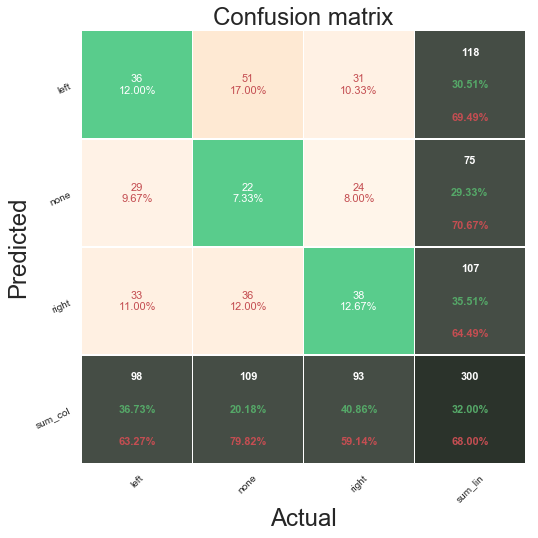

In [123]:
#display metrics on how the network performs
testPredict =random_model.predict(testXr)
print("predicted:")
print(np.argmax(testPredict,axis=1))
print(np.argmax(testPredict,axis=1).shape)
print("actual:")
print(np.argmax(testYr,axis=1))
print(classification_report(np.argmax(testYr,axis=1), np.argmax(testPredict,axis=1),target_names=["left","none","right"]))

cm = confusion_matrix(np.argmax(testYr,axis=1),np.argmax(testPredict,axis=1))

df_cm = pd.DataFrame(cm, index = [i for i in ["left","none","right"]],
                  columns = [i for i in ["left","none","right"]])
pretty_plot_confusion_matrix(df_cm)

as expected, the network is not able to accurately predict anything about random data.
























# Training the network on thinking left/none/right data

In [125]:
#training on thinking right/left
look_back=150
ravel=True
r_l_model, trainX, trainY, testX, testY, scaler = train_network(batch_size=50, starting_dir="code/museData2021-onlythinking",random=False, 
                             look_back = look_back,model_save_dir="left_right_thinking",ravel=ravel,epochs=12)

       Voltage1  Voltage2  Voltage3  Voltage4  Y
0      838.4982  849.3773  849.3773  845.7509 -1
1      842.9304  852.6007  852.1978  854.2125 -1
2      846.1539  850.1832  851.7949  859.4506 -1
3      835.6777  842.9304  850.5861  859.4506 -1
4      835.6777  844.1392  850.9890  851.7949 -1
...         ...       ...       ...       ... ..
24015  857.0330  850.1832  850.9890  861.4652 -1
24016  855.0183  845.3480  850.5861  856.2271 -1
24017  853.0037  844.1392  849.3773  845.3480 -1
24018  853.8095  844.5421  848.5714  852.6007 -1
24019  853.0037  845.7509  848.9744  863.8828 -1

[24020 rows x 5 columns]
Epoch 1/25
8/8 [==============================] - 2s 55ms/step - loss: 1.2195 - accuracy: 0.3516 - val_loss: 1.0887 - val_accuracy: 0.3229
Epoch 2/25
8/8 [==============================] - 0s 16ms/step - loss: 1.1766 - accuracy: 0.3932 - val_loss: 1.0915 - val_accuracy: 0.4167
Epoch 3/25
8/8 [==============================] - 0s 15ms/step - loss: 1.1023 - accuracy: 0.5052 - val_loss:

# Thinking left/none/right confusion matrix & success statistics

predicted:
[1 2 2 2 0 2 1 1 1 1 2 2 1 2 0 1 0 1 0 2 2 2 0 2 1 1 2 2 1 0 1 2 2 2 2 2 2
 1 0 2 0 1 1 2 1 1 0 2 2 2 0 0 2 2 2 2 2 2 1 2 0 2 1 2 1 2 2 1 0 1 2 0 1 2
 0 1 1 1 1 1 2 1 1 0 0 0 2 2 2 2 2 1 2 1 1 0]
(96,)
actual:
[1 0 0 2 0 0 1 1 1 0 0 0 2 0 0 1 2 2 0 2 2 2 0 2 1 1 2 2 1 0 1 2 0 2 2 0 2
 1 2 0 0 1 1 2 1 1 2 2 0 2 2 2 1 2 2 2 0 2 1 2 2 2 1 0 0 0 1 1 0 1 0 0 1 2
 0 1 1 2 1 1 2 1 1 2 2 2 0 2 2 0 1 1 0 1 1 0]
              precision    recall  f1-score   support

        left       0.53      0.34      0.42        29
        none       0.85      0.90      0.88        31
       right       0.55      0.67      0.60        36

    accuracy                           0.65        96
   macro avg       0.64      0.64      0.63        96
weighted avg       0.64      0.65      0.63        96



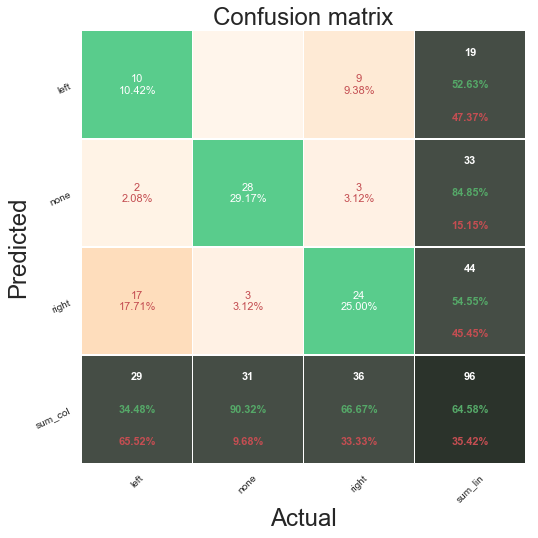

In [126]:
#display metrics on how the network performs
testPredict =r_l_model.predict(testX)
print("predicted:")
print(np.argmax(testPredict,axis=1))
print(np.argmax(testPredict,axis=1).shape)
print("actual:")
print(np.argmax(testY,axis=1))
print(classification_report(np.argmax(testY,axis=1), np.argmax(testPredict,axis=1),target_names=["left","none","right"]))

cm = confusion_matrix(np.argmax(testY,axis=1),np.argmax(testPredict,axis=1))

df_cm = pd.DataFrame(cm, index = [i for i in ["left","none","right"]],
                  columns = [i for i in ["left","none","right"]])
pretty_plot_confusion_matrix(df_cm)

### Thinking left/none/right analysis
It looks like the network can distinguish left & right from none, likely because the test subject was focusing intently when thinking left and right. This version of the trained model is right 90% of the time at predicting 'none' but usually just guesses 2 when its either 'right' or 'left'

It appears the network picked up on a confounding variable, focus

# Training on left/none/right jaw clench data

In [ ]:
#training on jaw data
look_back=240
ravel=True
model, trainXj, trainYj, testXj, testYj, scaler = train_network(batch_size=50, starting_dir="code/museData2021-jaws2",random=False, 
                             look_back = look_back,model_save_dir="newjaws",ravel=ravel,epochs=12)

# Jaw clench confusion matrix & success statistics

predicted:
[1 1 0 1 0 1 0 2 1 1 0 2 1 0 1 2 1 2 0 0 2 0 2 1 2 1 2 0 2 1 0 0 0 2 0 0 1
 0 0 2 2 1 0 0 2 1 1 1 2 1 1 0 1]
(53,)
actual:
[1 1 0 1 0 1 0 2 1 1 0 2 1 0 1 2 0 2 1 0 2 0 2 1 2 1 2 0 2 0 0 0 0 0 0 0 1
 0 0 2 1 1 0 0 0 1 1 1 2 1 1 2 1]
              precision    recall  f1-score   support

        left       0.89      0.81      0.85        21
        none       0.90      0.90      0.90        20
       right       0.79      0.92      0.85        12

    accuracy                           0.87        53
   macro avg       0.86      0.88      0.87        53
weighted avg       0.87      0.87      0.87        53



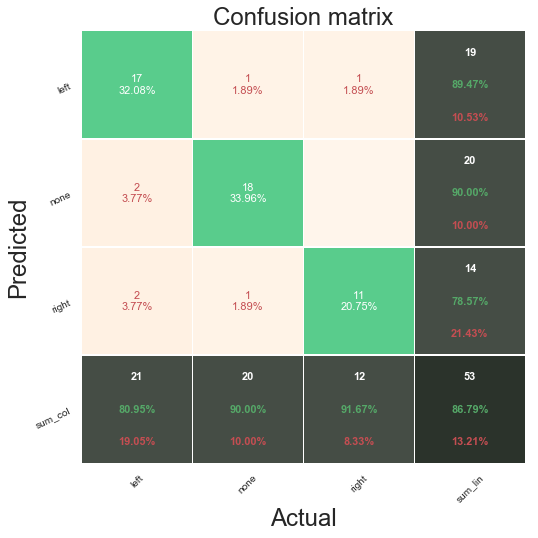

In [115]:
#display metrics on how the network performs
testPredict =model.predict(testXj)
print("predicted:")
print(np.argmax(testPredict,axis=1))
print(np.argmax(testPredict,axis=1).shape)
print("actual:")
print(np.argmax(testYj,axis=1))
print(classification_report(np.argmax(testYj,axis=1), np.argmax(testPredict,axis=1),target_names=["left","none","right"]))

cm = confusion_matrix(np.argmax(testYj,axis=1),np.argmax(testPredict,axis=1))

df_cm = pd.DataFrame(cm, index = [i for i in ["left","none","right"]],
                  columns = [i for i in ["left","none","right"]])
pretty_plot_confusion_matrix(df_cm)

## Jaw clench model analysis
The jaw prediction model works great! as you will see in the live test below, this accuracy is good enough to actually show promising live results.

# Live test model code

In [ ]:
#load in and quickly test model before doing live testing

#uncomment if loading from file
#MODEL_NAME = "left_right_thinking\\87.41-acc-64x3-batch-norm-4epoch-1639127968-loss-0.65.h5" 
#MODEL_NAME = "newjaws\\88.48-acc-64x3-batch-norm-0epoch-1639165811-loss-0.5.h5" 
#model= load_model(MODEL_NAME)

trainPredict = model.predict(trainX)
testPredict = model.predict(testX)
print(trainPredict[:,0])
trainScore = math.sqrt(mean_squared_error(trainY, trainPredict[:]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(testY, testPredict[:]))
print('Test Score: %.2f RMSE' % (testScore))

binarized_testY = numpy.array([np.argmax(v) for v in testPredict])
binarized_trainY = numpy.array([np.argmax(v) for v in trainPredict])

train_acc=0.0
for v in range (0,len(trainY)-1):
    if np.argmax(trainY[v]) == binarized_trainY[v]:
        train_acc = train_acc + 1/len(trainY)
print("train accuracy: ")
print(train_acc)
test_acc=0.0
for v in range (0,len(testY)-1):
    if np.argmax(testY[v]) == binarized_testY[v]:
        test_acc = test_acc + 1/len(testY)
print("test accuracy: ")
print(test_acc)

score = model.evaluate(testX, testY, batch_size=1000)
print(score)

In [43]:
#test trained model in real time

#display code
out = widgets.HTML()
display(out)

out1 = widgets.HTML()
display(out1)
out2 = widgets.HTML()
display(out2)
out3 = widgets.HTML()
display(out3)
out4 = widgets.HTML()
display(out4)
displays = [out1,out2,out3,out4]


#file data stream is being pulled from, this partners with an external C# program that directly reads from the headset
filename = "../../oscStream.txt"
cached_time =""
proc_data=[]
prev_index=0;
currR = np.array([])
currN = np.array([])
currL = np.array([])

def wipefile():
    try:
        f=open(filename,"w")
        f.write("")
        f.close()
    except PermissionError:
        time.sleep(.005)
        wipefile()
        
wipefile()
while 1:
    try:
        stamp = os.stat(filename).st_mtime
        if stamp != cached_time or cached_time=="":
            cached_time = stamp

            f= open(filename,"r")
            raw=f.readlines()
            
            contents =raw[prev_index:]
            prev_index=len(raw);
            for x in contents:
                if(x.find("jaw") != -1):
                    jj=1
                elif(x.find("blink") != -1):
                    jj=1
                elif(x.find("eeg") != -1):
                    temp = x.split('[')
                    tempA=[]
                    for w in range(1,5):
                        y=temp[w]
                        tempA.append(re.findall("[\d.]+",y)[0])
                    proc_data.append(tempA)
            if(len(proc_data)>look_back):
                example = np.array(proc_data[-look_back:]).astype('float32')
                example[:,:] = scaler.transform(example[:,:])
                if ravel:
                    volt=[]
                    for v in range(4):
                        variance=[]
                        for i in range(0,len(example)):
                            volt.append(np.array(example[i][v]))
                            variance.append(np.array(example[i][v]))
                        volt.append(np.var(np.array(variance)))
                        #display variance values of headset to help give an idea of latency, can be compared with displays on app
                        displays[v].value="<h1>sensor "+str(v)+": "+str(np.var(np.array(variance)))+"</h1>"
                    example=volt
                #predict based on current reading from headset
                o = model.predict(np.array([example]))
                o2=np.argmax(o[0])
                out.value="<h1>"+str(o2)+"</h1>"

    except (KeyboardInterrupt):
        print(len(proc_data))
        f= open(filename,"w")
        f.write("")
        f.close()
        break

HTML(value='')

HTML(value='')

HTML(value='')

HTML(value='')

HTML(value='')

14029


In [38]:
%%HTML
<video controls autoplay>
    <source src="jaws.mp4" type="video/mp4"/>
</video>

https://www.youtube.com/watch?v=YI8CgjPK-hI

the video above showcases that our setup has the capability to perform extremely well in real time!

# Ethics & Privacy

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;We believe that this project is ethical because no group will be benefitting or profiting from the
results of our project. We received informed consent from the individual who was used as a test
subject for this experiment. There are no risks associated with EEG sensors, so the subject was
not facing any physical or psychological threat during data collection. There are no privacy risks to
publicizing EEG voltage readings, because they do not contain information which could be used to
identify the individual they were collected from.

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;During our exploratory data analysis, we did delete data points from the “thinking left” data
frame. We did this because the “thinking left” scenario ran longer than the other two, and we
wanted to create visualizations based on collections of the same time length. We don’t believe that
deleting these data points biased our analysis because we were still performing an analysis based
on valid recordings of all three categories.

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;A potential bias is that we were collecting the data ourselves from only one user using an
EEG device that we own. The individual who recorded the sensor data did not have professional
training to do so.

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;This project, taken to an extreme, could foreseeably be classified as mind reading, which
poses some ethical concerns, however, there is evidence showing that EEGs will not be able to be
used as the complex mind reading, it can only pick up general brain patterns instead.

# Conclusion & Discussion

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;The data that we collected from the Muse EEG headset can be used in conjunction with machine learning methods to predict the directions that the user is thinking, from the options “left”, “right,” or neither. After training, our neural network achieved 66% accuracy when applied to test data, which is higher than chance (which would be 33% for this scenario).

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Although these results were lower than we had anticipated, our accuracy for the jaw clenching prediction tests was 87%. We believe that this score reflects the validity of our setup, and that accuracy for the mental indication tests could be improved by continuing to play with the code and our method of sampling data.

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;We used a Convolutional Neural network because we wanted something which could process entire sequences of data, as opposed to evaluating every datapoint in isolation. CNNs are commonly used for image identification and audio processing, but can also be a good option for classifying and making predictions based on a series of data points indexed in time order. This was important for our experiment, because each “chunk” of data (consisting of 100 timestamped collections of data from each of the four sensors) needed to be analyzed with consideration given to the preceding chunks.

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;There are several identifiable limitations to our project as it is. One limitation on the scope of our findings is that, since we were only training the model with EEG recordings collected from one user on one occasion, we are not able to guarantee that this model would be accurate for other users. Ideally, we would collect sensor data from many individuals and use all of those sets to train our model, so that we could ensure the data was not systematically biased due to one user’s actions while the voltages were recorded. While this makes our model, as it is, ungeneralizable, we view it as a jumping off point for future experimentation.

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Another potential limitation is that the MUSE headset only collects data from 4 sensors, whereas traditional EEG recorders usually range from 20-35. Again, our project could be viewed as the jumping off point for further experimentation and modeling to ensure that the network retains accuracy on sets with higher and more diverse collections of voltage data.

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;As we discovered when analyzing results from the mental indication prediction tests, another limitation is that our model could be affected by unexpected confounds. Because our model achieved 90% accuracy at predicting whether the user was indicating a direction or in a neutral state, it seems like the model was actually predicting whether the user was focused on something or not. It would be interesting to collect more data from participants doing different mental tasks, to try and find our way around this confound task.

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Our findings are very exciting, because they imply that a relatively inexpensive, portable and overall accessible product has the potential to act as a brain-machine interface. The MUSE headset retails for as low as 200 dollars, whereas traditional EEG headsets range from upwards of 1,500 dollars. It is non-invasive and easy to set up. This kind of technology could help disabled users control devices without any physical or verbal interaction.


# Final Video Link

- https://www.youtube.com/watch?v=gEQwOslps6c

# Team Contributions

Phoebe - video presentation, background research

Kyle - Helped design & test machine learning code, data visualizations, 

Thea - Conclusion, Privacy/Ethics

Aidan - Handled gathering all the data from the muse EEG headset, and worked on machine learning code

Our team met in person and over discord to discuss the project, review each other’s work and collaborate on all of the sections.